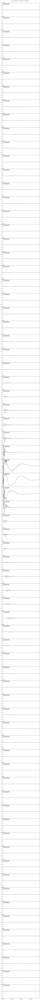

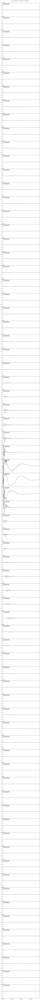

In [42]:
from pathlib import Path
box_folder_root = Path("/Users/glennthompson/Library/CloudStorage/Box-Box/thompsong/2026KarstGeophysicsDEP")
seismic_analysis_dir = box_folder_root / "04_FieldData" 
METADATA_XLSX = seismic_analysis_dir /  "jochen_field_notes_metadata_tables.xlsx"
filename = box_folder_root / "05_Analysis" / "Refraction" / "segy" / "3025.segy"

import obspy
st = obspy.read(filename)
for tracenum, tr in enumerate(st):
    tr.id = f"LB.{tracenum:02d}.GEODE.GHZ"
st.plot()

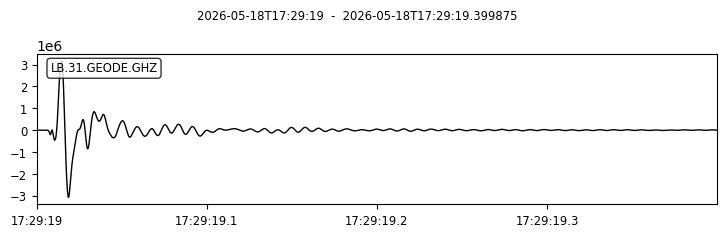

In [43]:
st[31].plot();

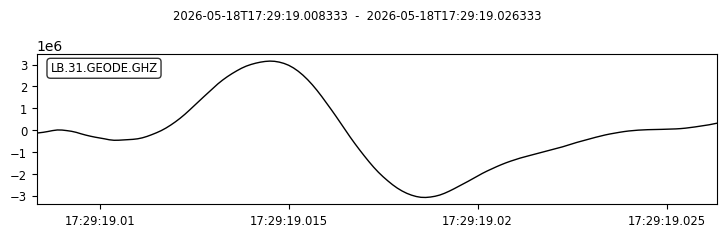

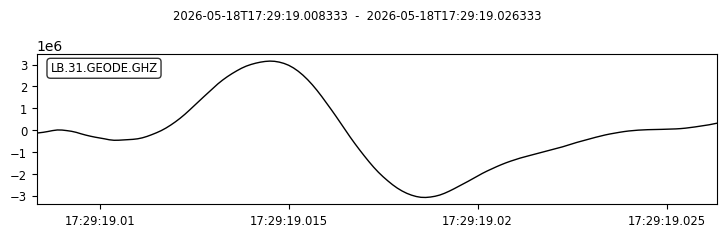

In [44]:
triggertime = st[0].stats.starttime

shot_position = 120.5
selected_trace_num = 31
speed = 300.0
pulse_length = 0.018

geophone_position = selected_trace_num + 87  # check this mapping!
distance_from_shot = abs(shot_position - geophone_position)
traveltime = distance_from_shot / speed

t1 = triggertime + traveltime
t2 = t1 + pulse_length

st[selected_trace_num].plot(starttime=t1, endtime=t2)


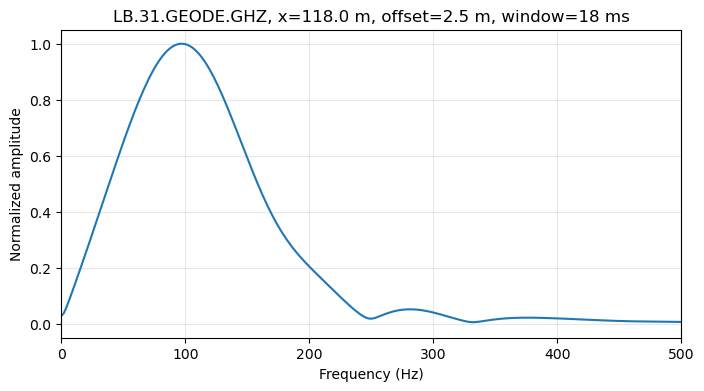

In [45]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import detrend
from scipy.signal.windows import tukey

tr = st[selected_trace_num].copy()

# Trim the pulse window
pulse = tr.slice(starttime=t1, endtime=t2)
x = pulse.data.astype(float)

# Basic cleanup
x = detrend(x, type="linear")
x = x - np.mean(x)

# Taper
dt = pulse.stats.delta
win = tukey(len(x), alpha=0.5)
x_tapered = x * win

# FFT with zero padding for smooth display
nfft = 4096
freq = np.fft.rfftfreq(nfft, dt)
amp = np.abs(np.fft.rfft(x_tapered, n=nfft))

# Normalize for shape comparison
amp_norm = amp / np.nanmax(amp)

fig, ax = plt.subplots(figsize=(8, 4))
ax.plot(freq, amp_norm)
ax.set_xlim(0, 500)
ax.set_xlabel("Frequency (Hz)")
ax.set_ylabel("Normalized amplitude")
ax.set_title(
    f"{pulse.id}, x={geophone_position:.1f} m, "
    f"offset={distance_from_shot:.1f} m, window={pulse_length*1000:.0f} ms"
)
ax.grid(True, alpha=0.3)
plt.show()

In [46]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import detrend
from scipy.signal.windows import tukey


def extract_tapered_pulse(
    st,
    selected_trace_num,
    shot_position,
    triggertime=None,
    speed=300.0,
    pulse_length=0.018,
    position_offset=87.0,
    taper_alpha=0.5,
):
    """
    Extract a short pulse window from one trace, based on shot-receiver travel time.
    """

    tr = st[selected_trace_num].copy()

    if triggertime is None:
        triggertime = st[0].stats.starttime

    geophone_position = selected_trace_num + position_offset
    distance_from_shot = abs(shot_position - geophone_position)
    traveltime = distance_from_shot / speed

    t1 = triggertime + traveltime
    t2 = t1 + pulse_length

    pulse = tr.slice(starttime=t1, endtime=t2)
    x = pulse.data.astype(float)

    if len(x) < 4:
        raise ValueError(f"Pulse window too short for trace {selected_trace_num}")

    x = detrend(x, type="linear")
    x = x - np.mean(x)

    win = tukey(len(x), alpha=taper_alpha)
    x_tapered = x * win

    info = {
        "trace_index": selected_trace_num,
        "trace_id": tr.id,
        "geophone_position": geophone_position,
        "shot_position": shot_position,
        "distance_from_shot": distance_from_shot,
        "speed": speed,
        "traveltime": traveltime,
        "starttime": t1,
        "endtime": t2,
        "pulse_length": pulse_length,
        "dt": pulse.stats.delta,
    }

    return pulse, x, x_tapered, info

In [47]:
def plot_pulse_and_spectrum(
    pulse,
    x,
    x_tapered,
    info,
    nfft=4096,
    fmax=500,
    normalize=True,
):
    """
    Plot raw/tapered pulse and its amplitude spectrum.
    """

    dt = info["dt"]
    t = np.arange(len(x)) * dt

    freq = np.fft.rfftfreq(nfft, dt)
    amp = np.abs(np.fft.rfft(x_tapered, n=nfft))

    if normalize and np.nanmax(amp) > 0:
        amp_plot = amp / np.nanmax(amp)
        ylabel = "Normalized amplitude"
    else:
        amp_plot = amp
        ylabel = "Amplitude"

    fig, axes = plt.subplots(2, 1, figsize=(9, 6), constrained_layout=True)

    axes[0].plot(t, x, label="Raw")
    axes[0].plot(t, x_tapered, label="Tapered")
    axes[0].set_xlabel("Time since window start (s)")
    axes[0].set_ylabel("Amplitude")
    axes[0].set_title(
        f"{info['trace_id']}, x={info['geophone_position']:.1f} m, "
        f"offset={info['distance_from_shot']:.1f} m"
    )
    axes[0].legend()
    axes[0].grid(True, alpha=0.3)

    axes[1].plot(freq, amp_plot)
    axes[1].set_xlim(0, fmax)
    axes[1].set_xlabel("Frequency (Hz)")
    axes[1].set_ylabel(ylabel)
    axes[1].set_title(f"Spectrum, window={info['pulse_length']*1000:.0f} ms")
    axes[1].grid(True, alpha=0.3)

    plt.show()

    return freq, amp

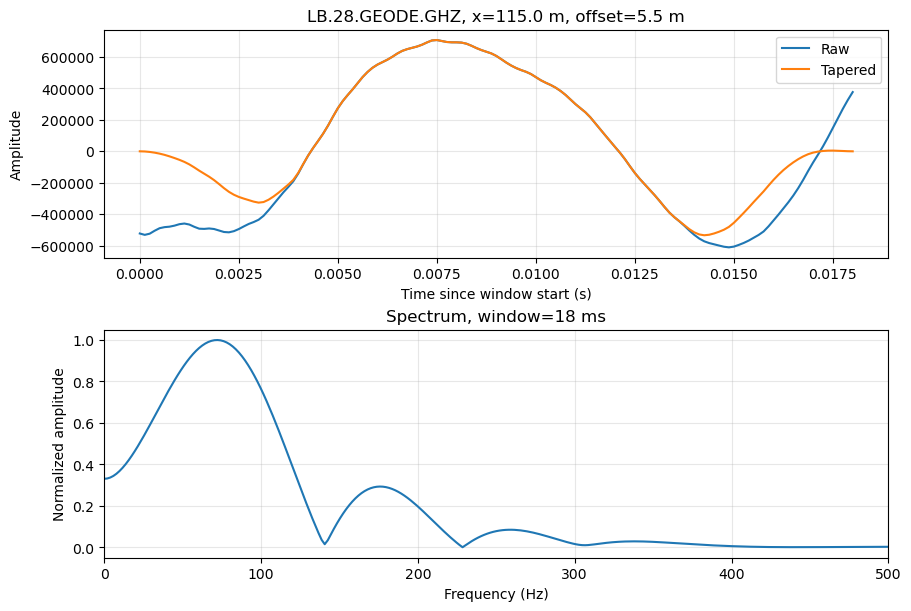

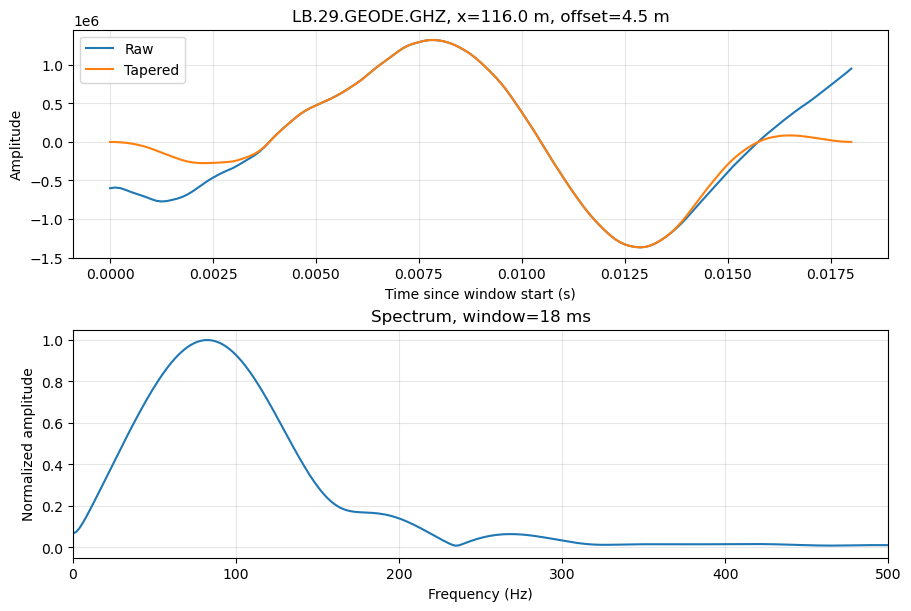

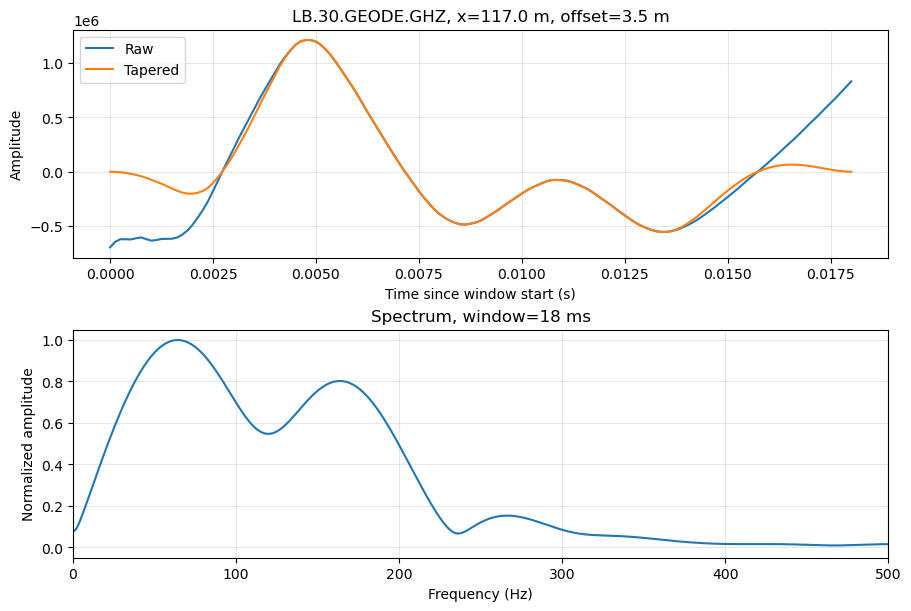

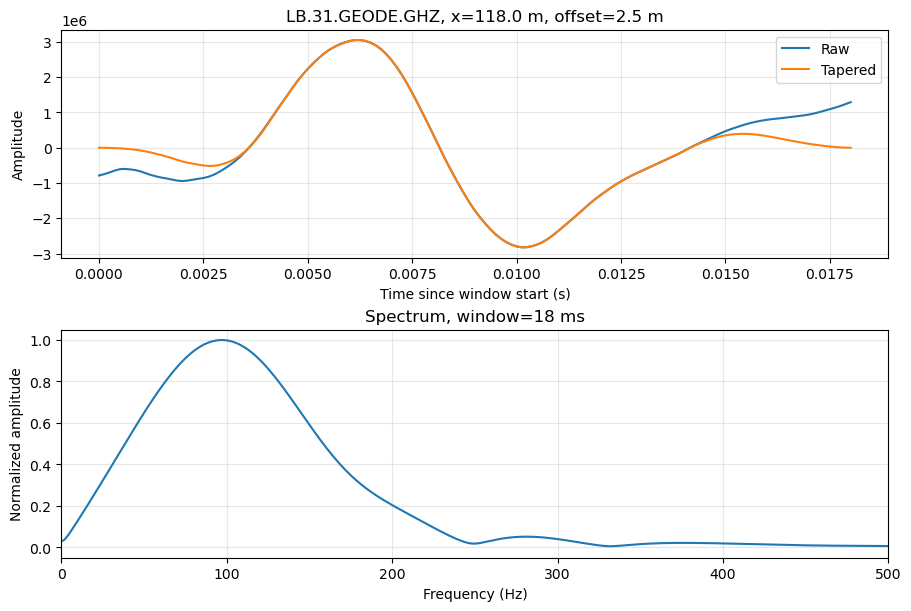

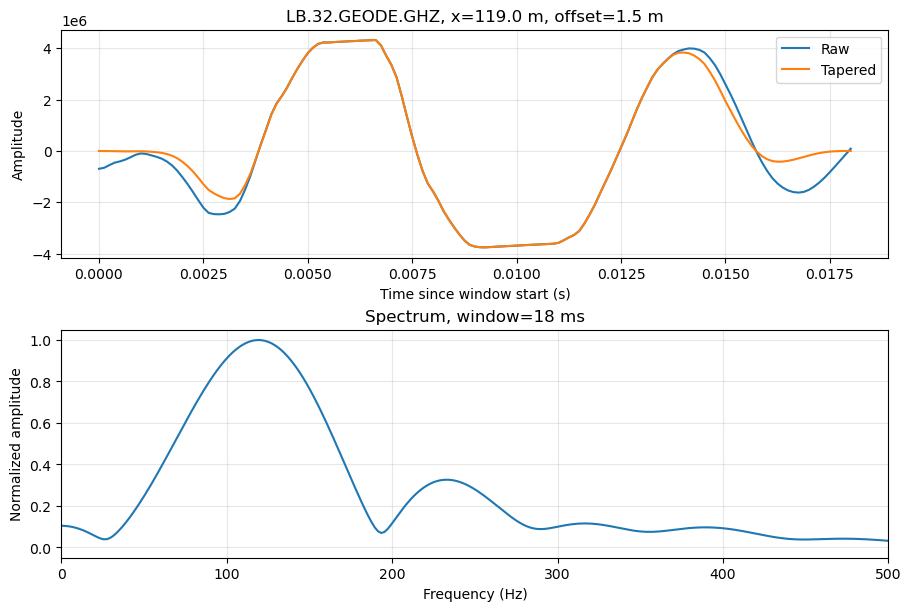

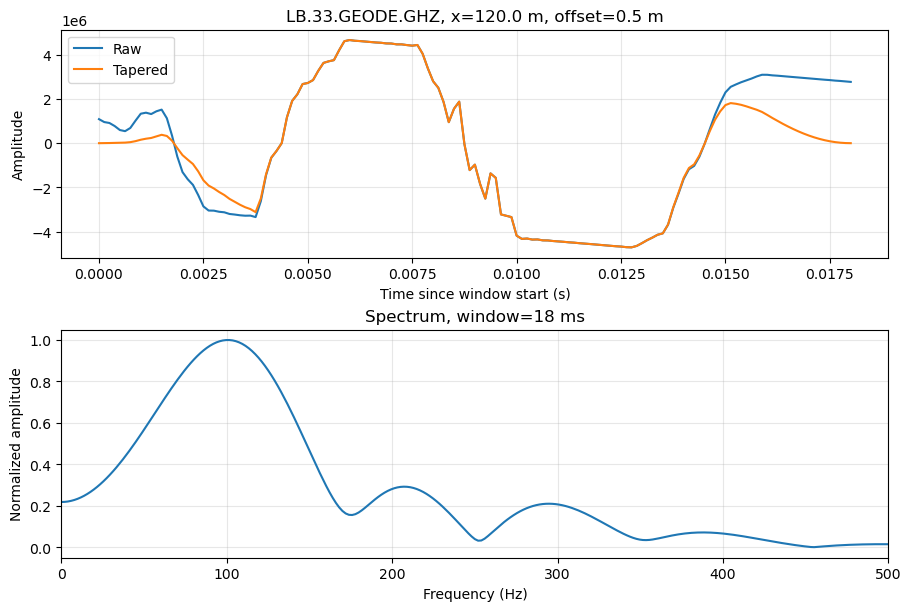

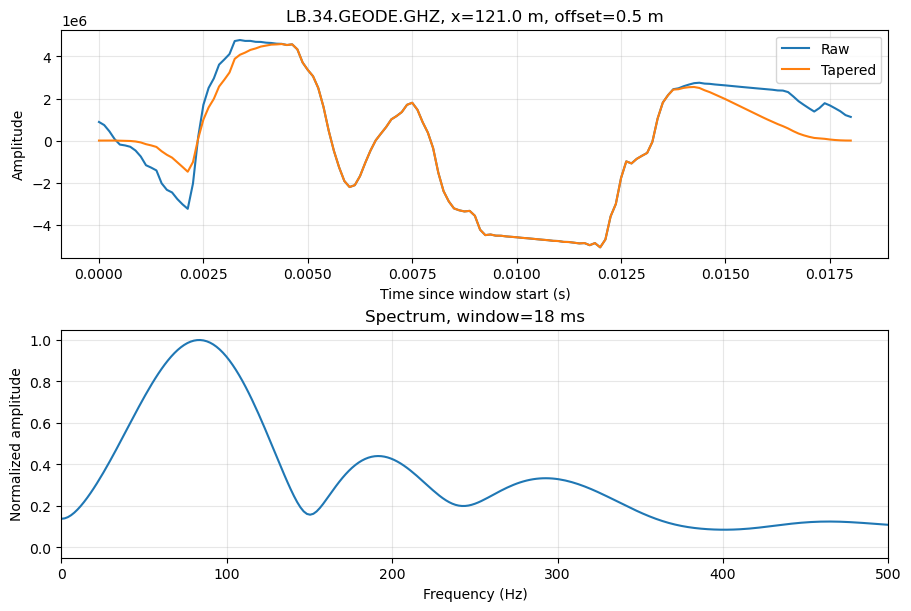

In [48]:
shot_position = 120.5
selected_trace_nums = [28, 29, 30, 31, 32, 33, 34]

results = {}

for selected_trace_num in selected_trace_nums:
    pulse, x, x_tapered, info = extract_tapered_pulse(
        st,
        selected_trace_num=selected_trace_num,
        shot_position=shot_position,
        speed=300.0,
        pulse_length=0.018,
        position_offset=87.0,
    )

    freq, amp = plot_pulse_and_spectrum(
        pulse,
        x,
        x_tapered,
        info,
        nfft=4096,
        fmax=500,
        normalize=True,
    )

    results[selected_trace_num] = {
        "pulse": pulse,
        "x": x,
        "x_tapered": x_tapered,
        "info": info,
        "freq": freq,
        "amp": amp,
    }

In [49]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import sys
sys.path.append('../lib')
import segy_tools.gather
import segy_tools.plotting


def compute_pulse_windows_for_traces(
    st,
    selected_trace_nums,
    shot_position,
    triggertime=None,
    speed=300.0,
    pulse_length=0.018,
    first_receiver_x_m=87.0,
):
    if triggertime is None:
        triggertime = st[0].stats.starttime

    stream_start = st[0].stats.starttime
    rows = []

    for selected_trace_num in selected_trace_nums:
        tr = st[selected_trace_num]

        try:
            loc_num = int(tr.stats.location)
        except Exception:
            loc_num = selected_trace_num

        geophone_position = first_receiver_x_m + loc_num
        distance = abs(shot_position - geophone_position)
        traveltime = distance / speed

        abs_t1 = triggertime + traveltime
        abs_t2 = abs_t1 + pulse_length

        rows.append(
            {
                "trace_index": selected_trace_num,
                "trace_id": tr.id,
                "location_code": tr.stats.location,
                "geophone_position": geophone_position,
                "shot_position": shot_position,
                "distance_m": distance,
                "speed_mps": speed,
                "traveltime_s": traveltime,
                "t1_s": abs_t1 - stream_start,
                "t2_s": abs_t2 - stream_start,
                "abs_t1": abs_t1,
                "abs_t2": abs_t2,
            }
        )

    return rows

In [50]:
def receiver_x_from_location_codes(st, first_receiver_x_m=87.0):
    """
    For Geode traces where location codes are 00, 01, 02, ...
    return receiver positions 87, 88, 89, ... m.
    """
    receiver_x_m = []

    for i, tr in enumerate(st):
        loc = tr.stats.location

        try:
            loc_num = int(loc)
        except Exception:
            loc_num = i

        receiver_x_m.append(first_receiver_x_m + loc_num)

    return np.asarray(receiver_x_m, dtype=float)

In [51]:
def plot_wiggle_with_pulse_windows(
    st,
    windows,
    shot_position,
    first_receiver_x_m=87.0,
    tmin=0.0,
    tmax=0.25,
    scale=0.8,
    clip_percentile=99,
    normalize=True,
    title="Shot gather with source-pulse windows",
    window_width_m=0.8,
):
    """
    Plot wiggle gather using receiver positions from location codes:
    loc 00 -> first_receiver_x_m
    loc 01 -> first_receiver_x_m + 1
    etc.
    """

    npts = min(tr.stats.npts for tr in st)
    dt = float(st[0].stats.delta)

    time = np.arange(npts) * dt
    data = np.vstack([tr.data[:npts].astype(float) for tr in st])

    receiver_x_m = receiver_x_from_location_codes(
        st,
        first_receiver_x_m=first_receiver_x_m,
    )

    order = np.argsort(receiver_x_m)
    time = time
    data = data[order]
    receiver_x_m = receiver_x_m[order]

    fig = segy_tools.plotting.plot_wiggle_gather(
        time=time,
        data=data,
        receiver_x_m=receiver_x_m,
        source_x_m=shot_position,
        title=title,
        tmin=tmin,
        tmax=tmax,
        scale=scale,
        clip_percentile=clip_percentile,
        normalize=normalize,
    )

    ax = fig.axes[0]

    for w in windows:
        x = w["geophone_position"]
        t1 = w["t1_s"]
        t2 = w["t2_s"]

        rect = patches.Rectangle(
            (x - window_width_m / 2, t1),
            window_width_m,
            t2 - t1,
            linewidth=1.5,
            edgecolor="lime",
            facecolor="lime",
            alpha=0.35,
            zorder=10,
        )
        ax.add_patch(rect)

        ax.plot(
            [x - window_width_m / 2, x + window_width_m / 2],
            [t1, t1],
            color="black",
            linewidth=1.0,
            zorder=11,
        )

    plt.show()
    return fig

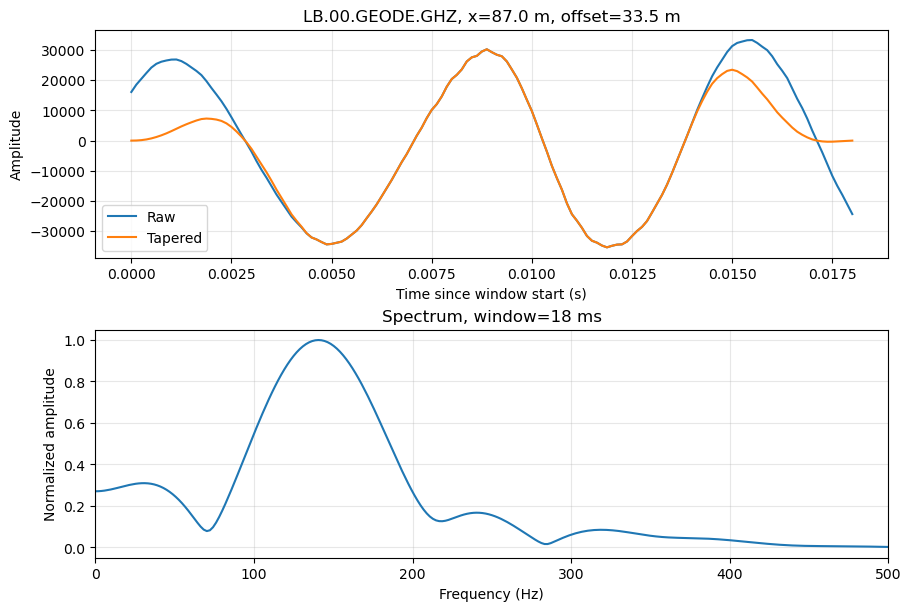

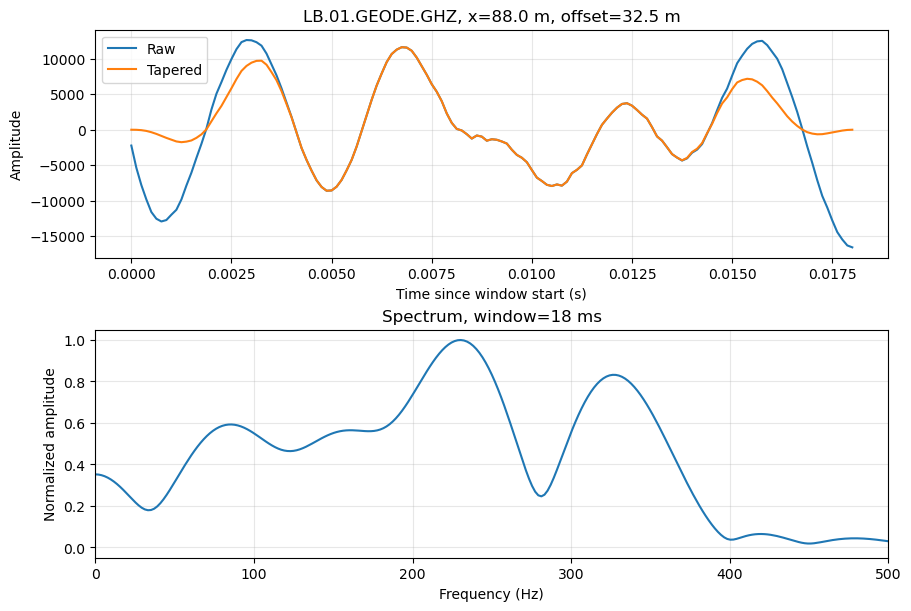

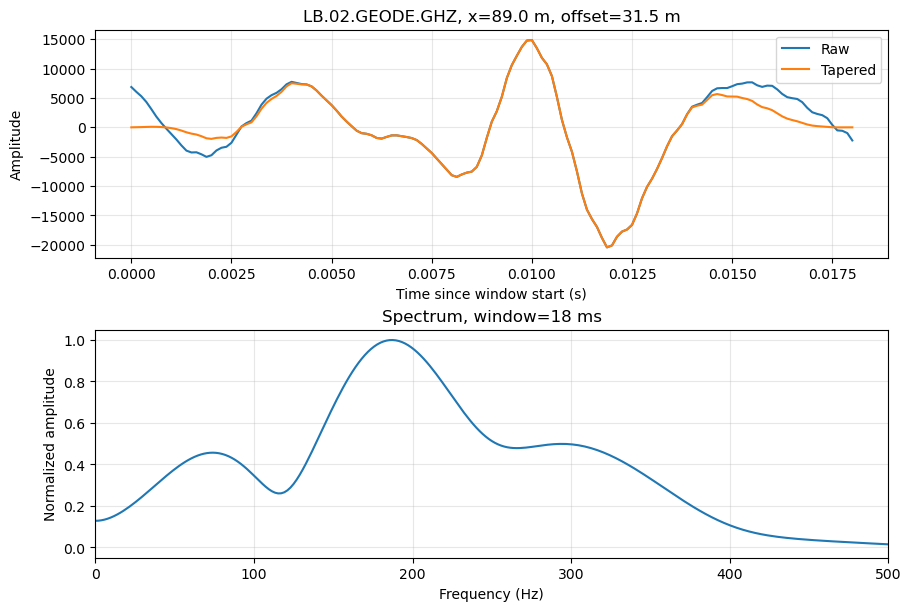

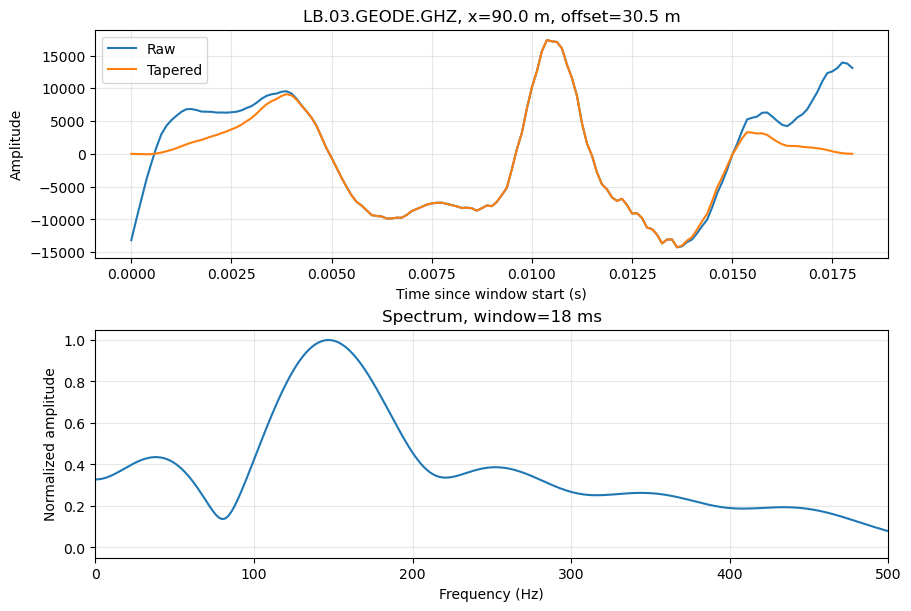

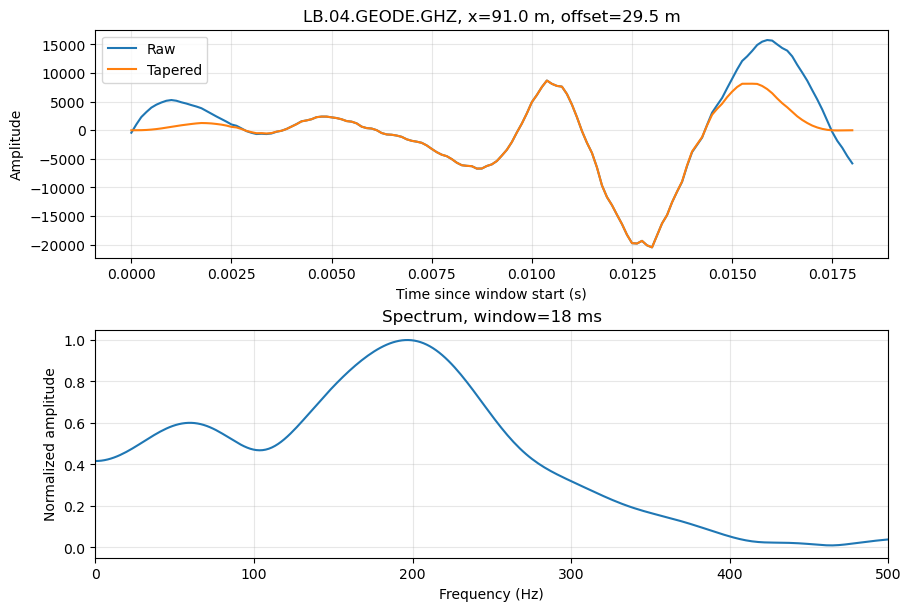

...

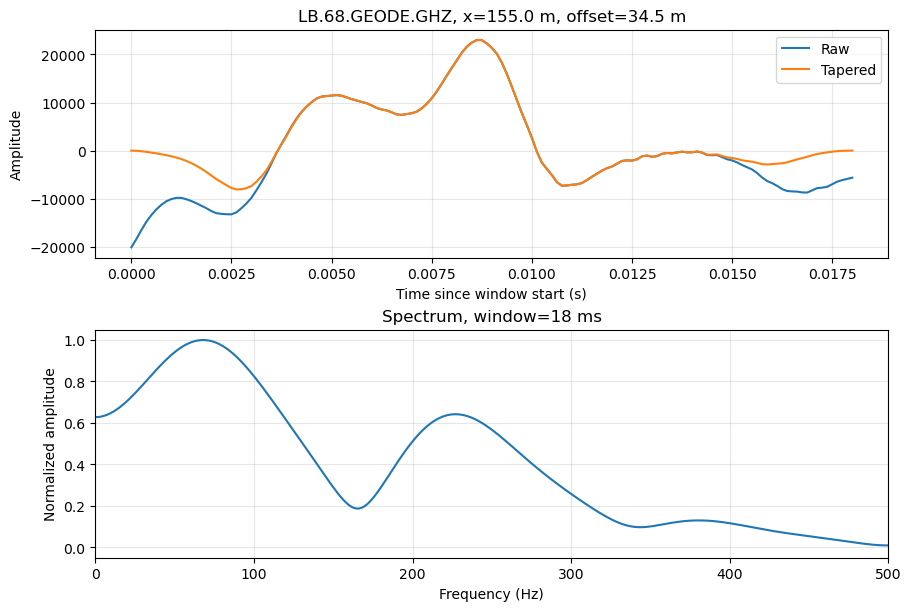

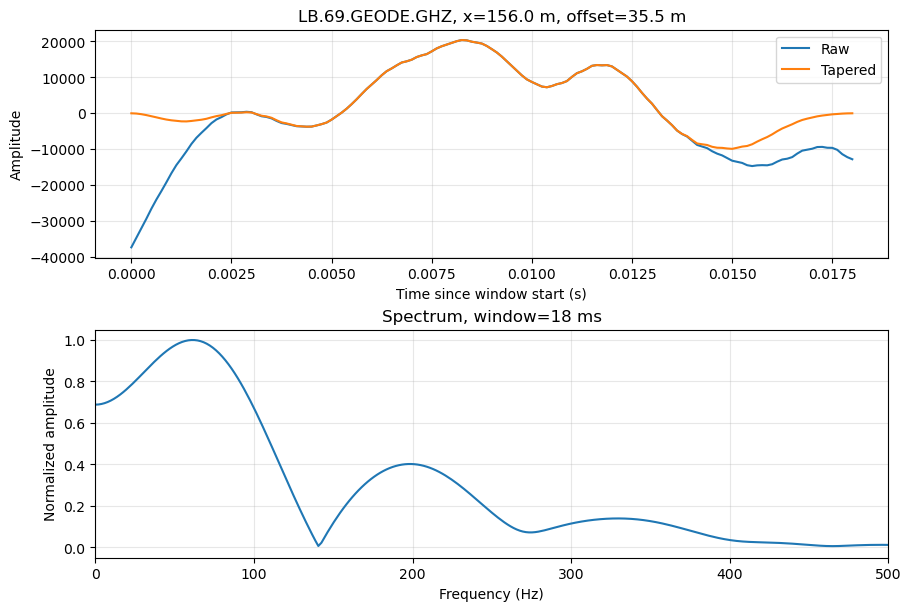

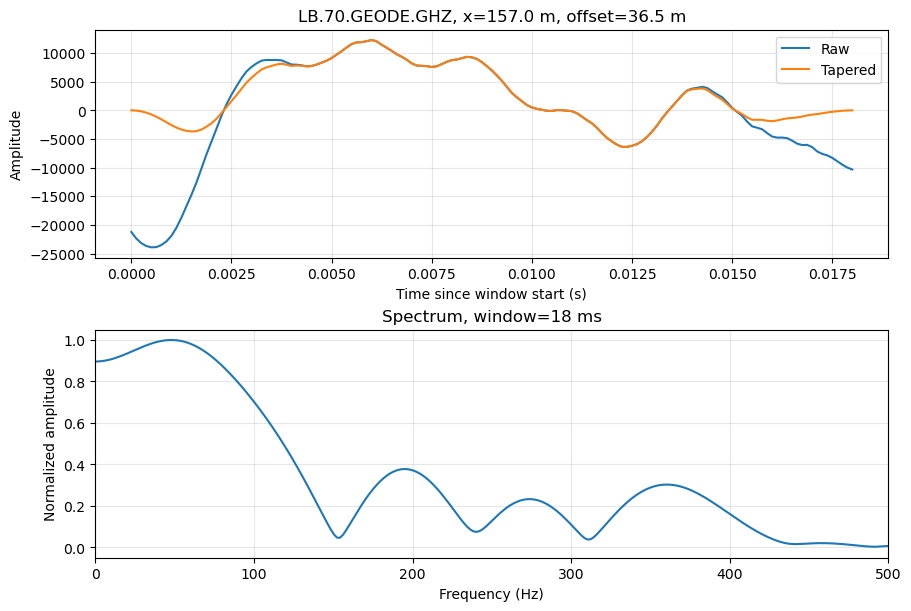

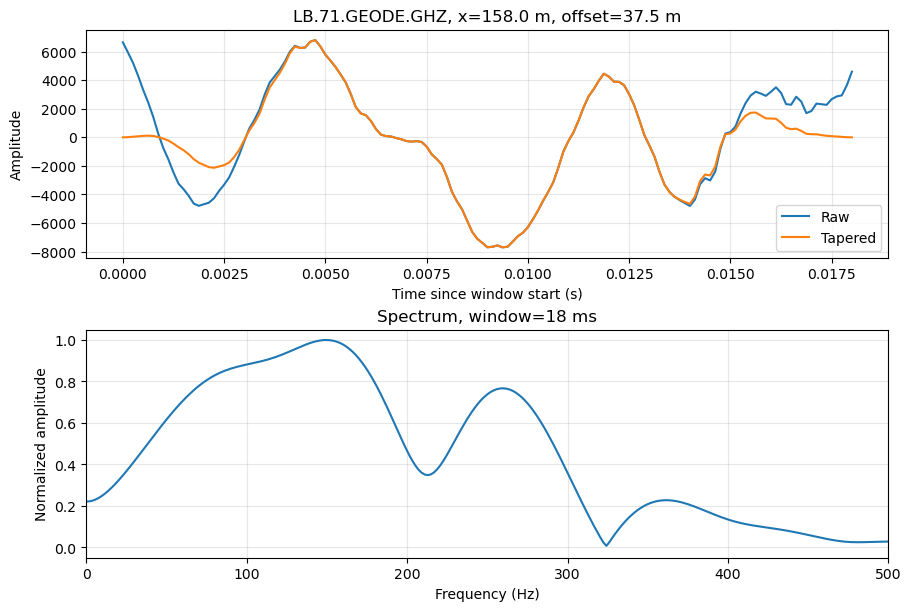

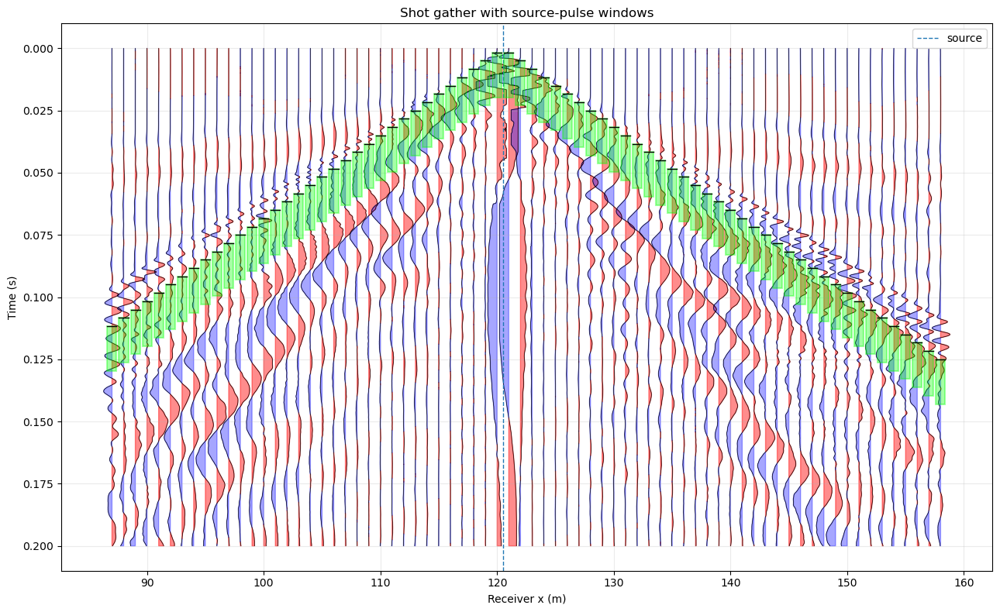

In [52]:
shot_position = 120.5
first_receiver_x_m = 87.0
selected_trace_nums = range(0, 72, 1) # [28, 29, 30, 31, 32, 33, 34] 
speed = 300
pulse_length = 0.018
results = {}

for selected_trace_num in selected_trace_nums:
    pulse, x, x_tapered, info = extract_tapered_pulse(
        st,
        selected_trace_num=selected_trace_num,
        shot_position=shot_position,
        speed=speed,
        pulse_length=pulse_length,
        position_offset=first_receiver_x_m
    )

    freq, amp = plot_pulse_and_spectrum(
        pulse,
        x,
        x_tapered,
        info,
        nfft=4096,
        fmax=500,
        normalize=True,
    )

    results[selected_trace_num] = {
        "pulse": pulse,
        "x": x,
        "x_tapered": x_tapered,
        "info": info,
        "freq": freq,
        "amp": amp,
    }

windows = compute_pulse_windows_for_traces(
    st,
    selected_trace_nums=selected_trace_nums,
    shot_position=shot_position,
    speed=speed,
    pulse_length=pulse_length,
    first_receiver_x_m=first_receiver_x_m,
)

fig = plot_wiggle_with_pulse_windows(
    st,
    windows,
    shot_position=shot_position,
    first_receiver_x_m=first_receiver_x_m,
    tmin=0.0,
    tmax=0.20,
)

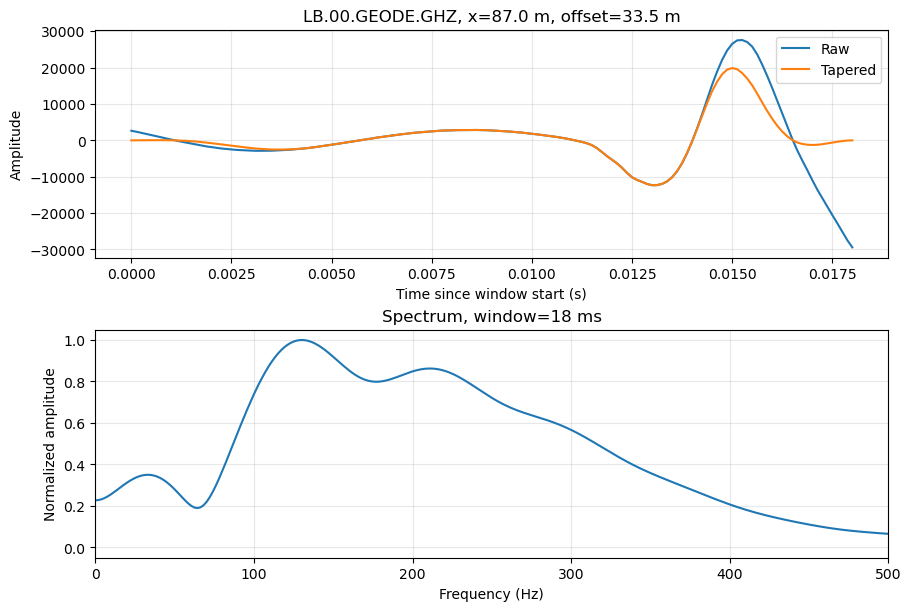

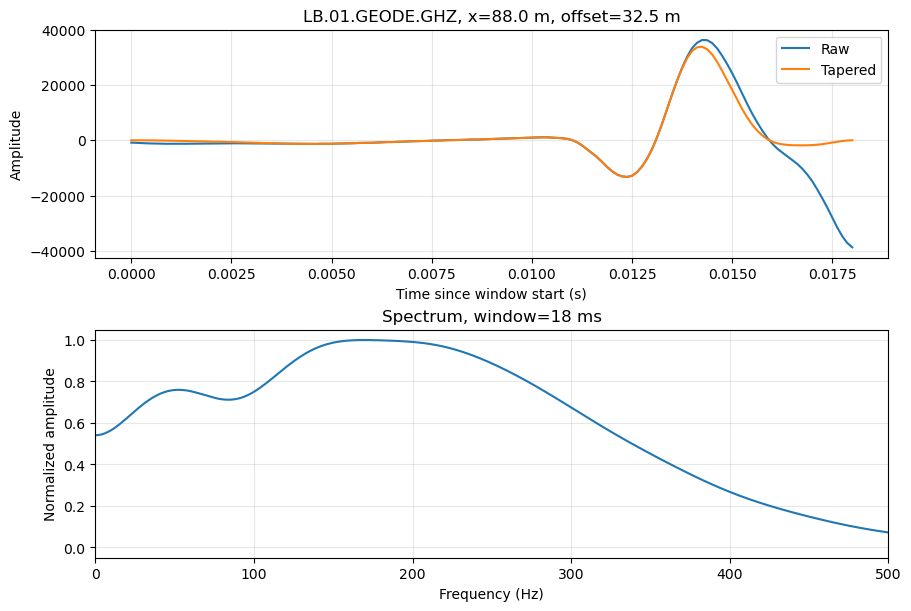

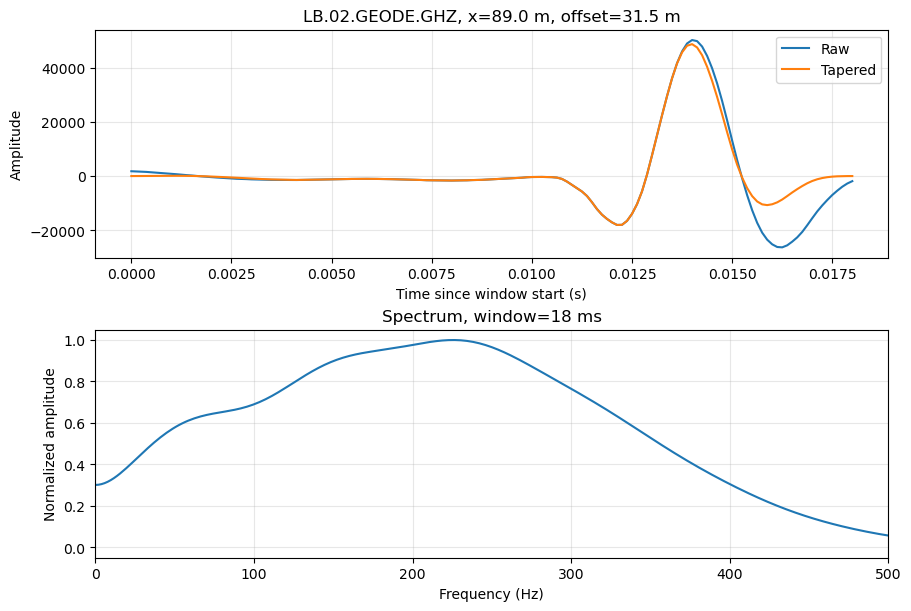

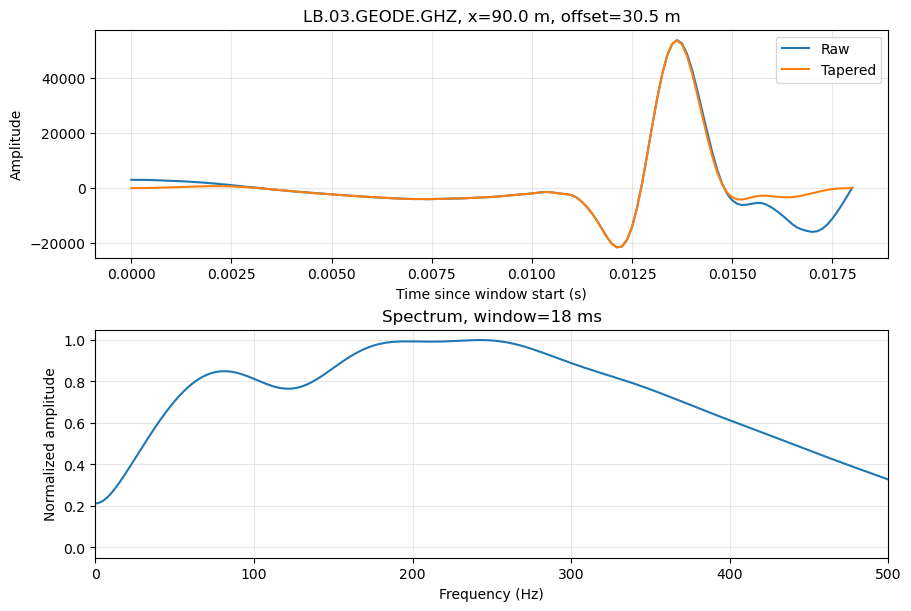

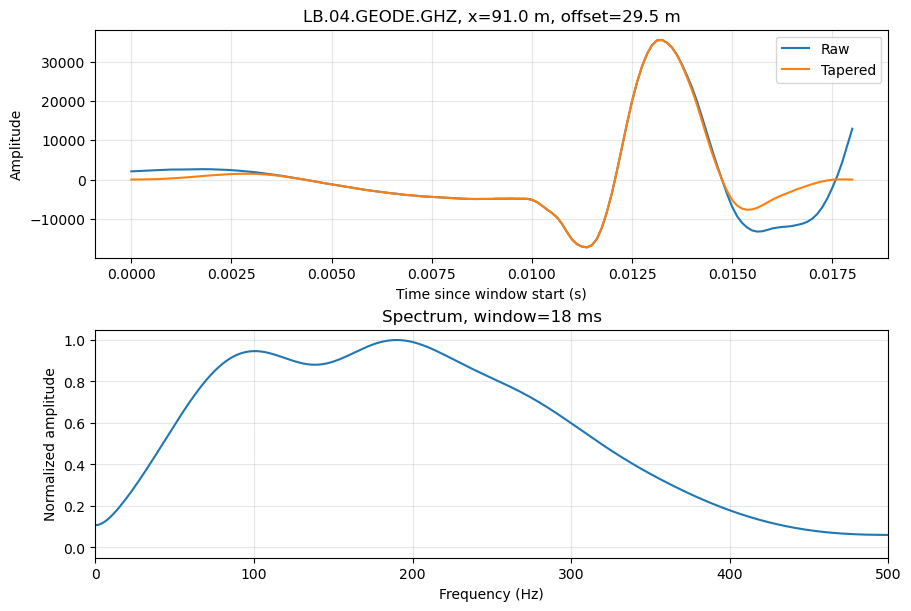

...

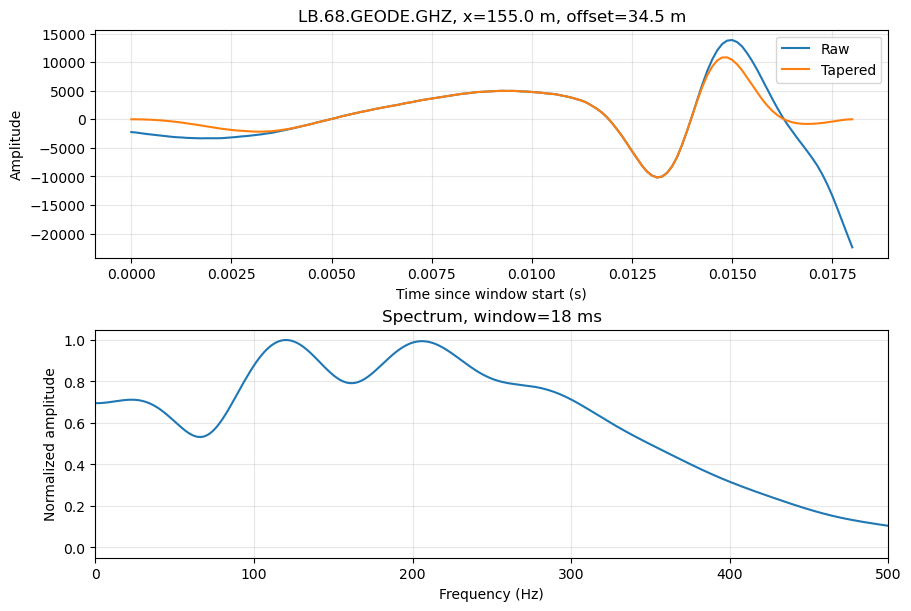

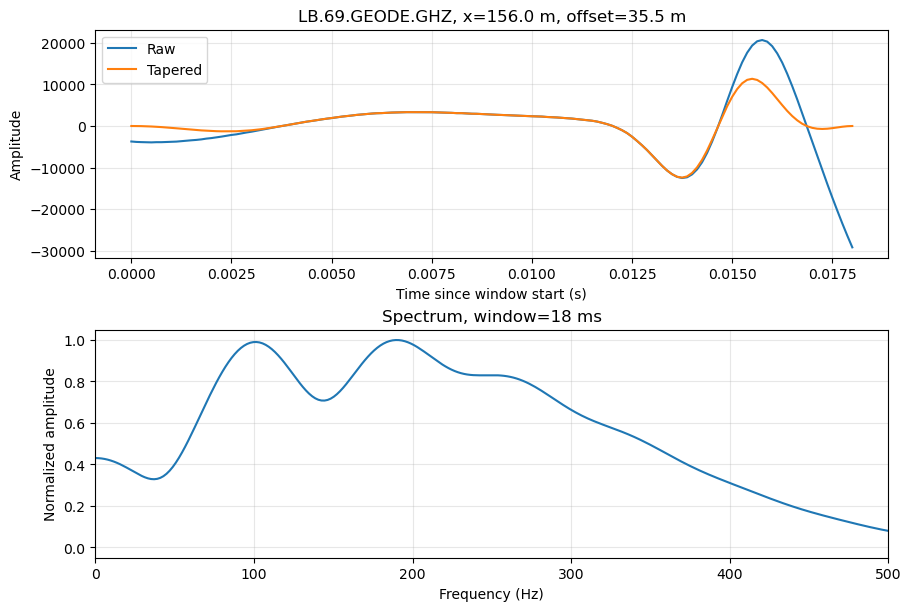

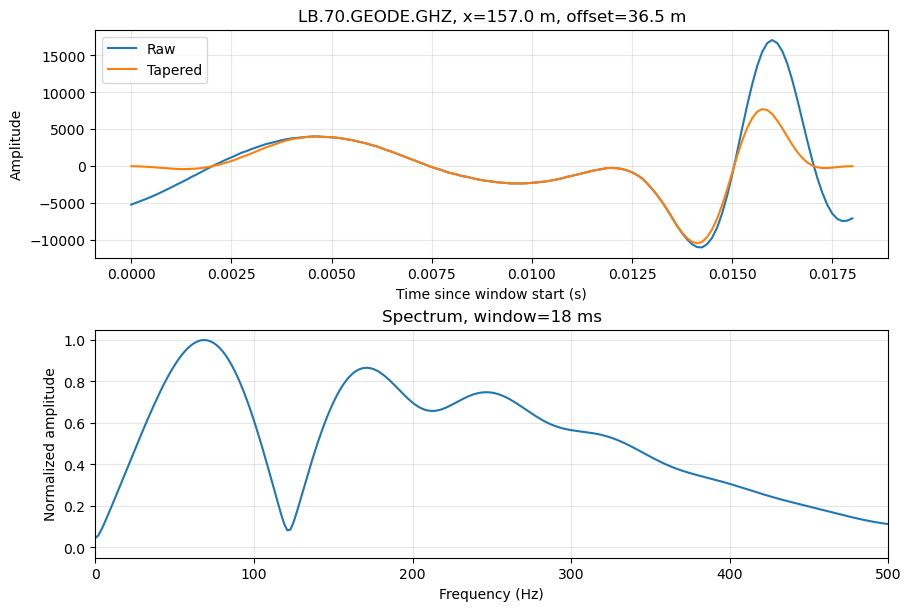

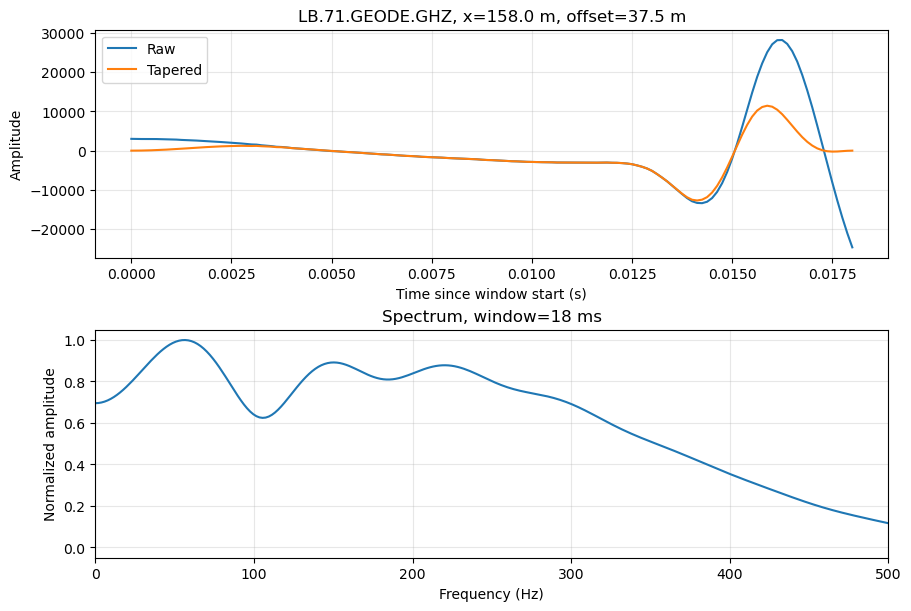

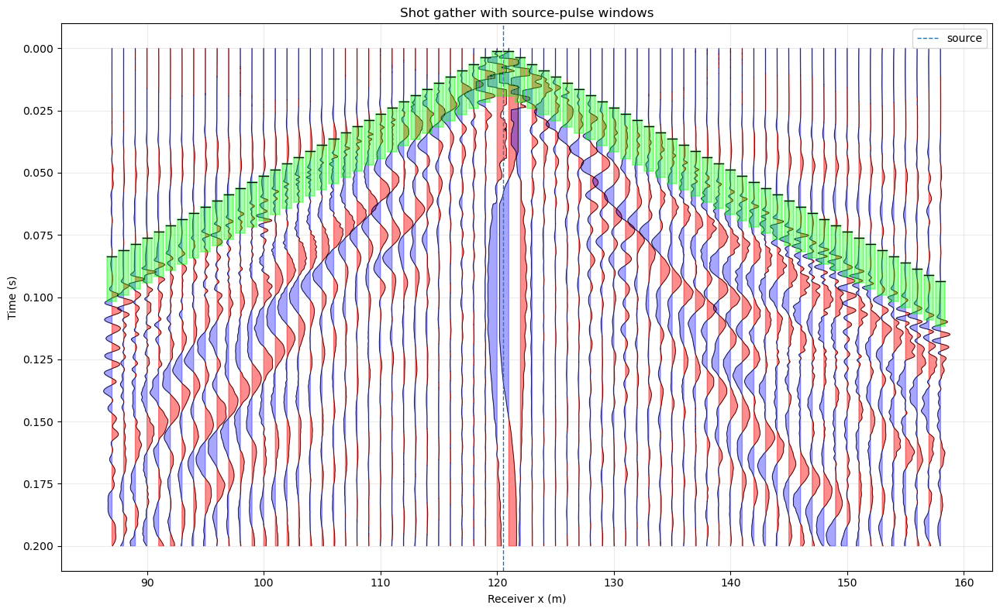

In [53]:
shot_position = 120.5
first_receiver_x_m = 87.0
selected_trace_nums = range(0, 72, 1) # [28, 29, 30, 31, 32, 33, 34] 
speed = 400
pulse_length = 0.018
results = {}

for selected_trace_num in selected_trace_nums:
    pulse, x, x_tapered, info = extract_tapered_pulse(
        st,
        selected_trace_num=selected_trace_num,
        shot_position=shot_position,
        speed=speed,
        pulse_length=pulse_length,
        position_offset=first_receiver_x_m
    )

    freq, amp = plot_pulse_and_spectrum(
        pulse,
        x,
        x_tapered,
        info,
        nfft=4096,
        fmax=500,
        normalize=True,
    )

    results[selected_trace_num] = {
        "pulse": pulse,
        "x": x,
        "x_tapered": x_tapered,
        "info": info,
        "freq": freq,
        "amp": amp,
    }

windows = compute_pulse_windows_for_traces(
    st,
    selected_trace_nums=selected_trace_nums,
    shot_position=shot_position,
    speed=speed,
    pulse_length=pulse_length,
    first_receiver_x_m=first_receiver_x_m,
)

fig = plot_wiggle_with_pulse_windows(
    st,
    windows,
    shot_position=shot_position,
    first_receiver_x_m=first_receiver_x_m,
    tmin=0.0,
    tmax=0.20,
)